<a href="https://colab.research.google.com/github/Shadabur-Rahaman/30-days-ml-projects/blob/main/Day_15_Object_Detection_YOLO_Cleaned/notebooks/Day_15_Object_Detection_YOLO_Cleaned.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 📘 Day 15 : Object Detection with YOLO

In this notebook, we demonstrate basic object detection using the **YOLOv5** model (You Only Look Once), a state-of-the-art real-time object detection system.

We'll use the pretrained YOLOv5 model from the [Ultralytics](https://github.com/ultralytics/yolov5) library.

👉 Goal: Detect objects in custom or sample images using YOLOv5.

In [ ]:
# 🛠️ Install YOLOv5 (Uncomment if not installed)
# !git clone https://github.com/ultralytics/yolov5
# %cd yolov5
# !pip install -r requirements.txt

## 🖼️ Load and Visualize Sample Image

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-5-29 Python-3.11.12 torch-2.6.0+cu124 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 



🔍 Running detection on Image 1...


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 720x1280 2 persons, 1 tie, 1 cell phone
Speed: 745.3ms pre-process, 301.4ms inference, 2.3ms NMS per image at shape (1, 3, 384, 640)


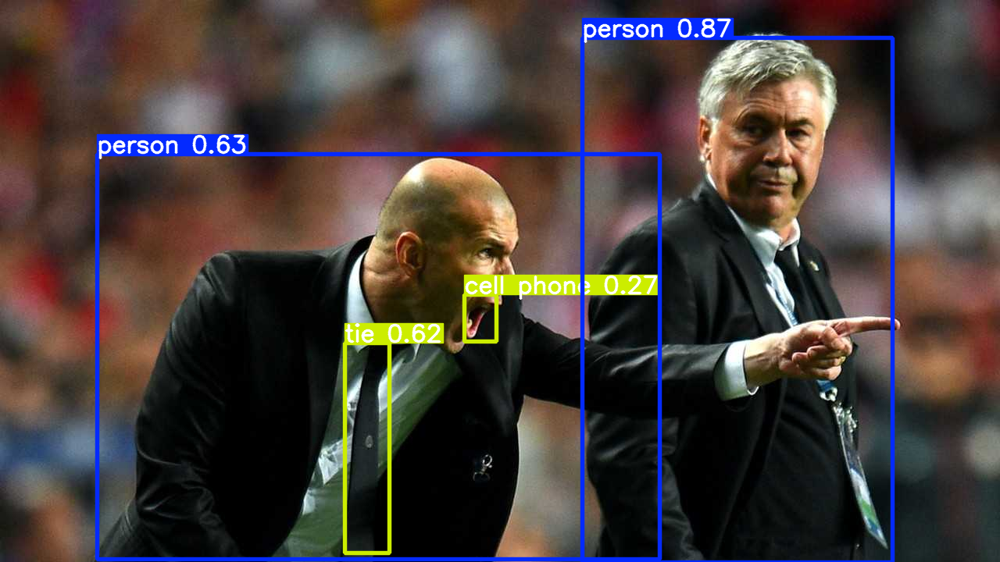

Saved 1 image to runs/detect/exp


✅ Saved: prediction_img1.png


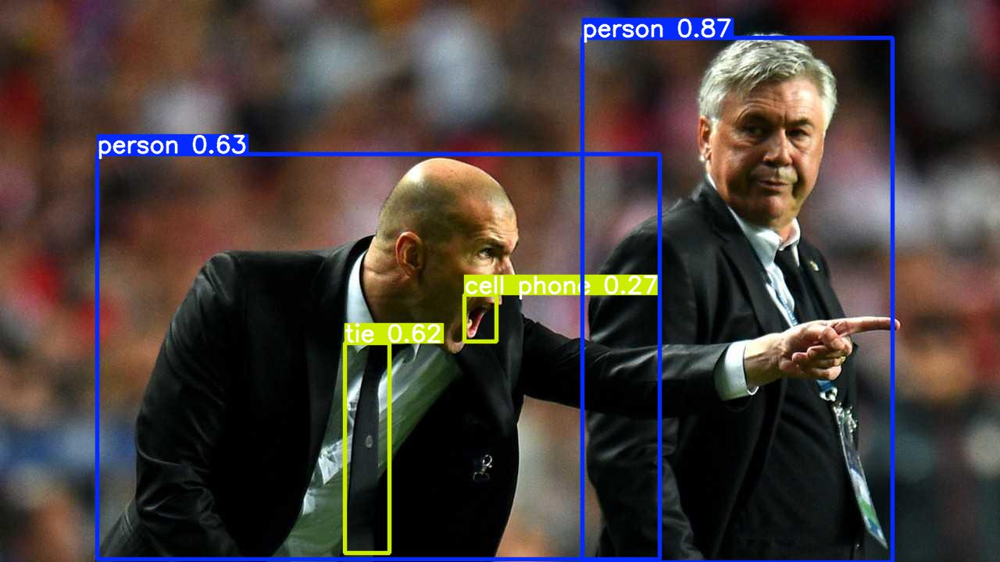


🔍 Running detection on Image 2...


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 1080x810 4 persons, 1 bus
Speed: 814.2ms pre-process, 437.1ms inference, 5.7ms NMS per image at shape (1, 3, 640, 480)


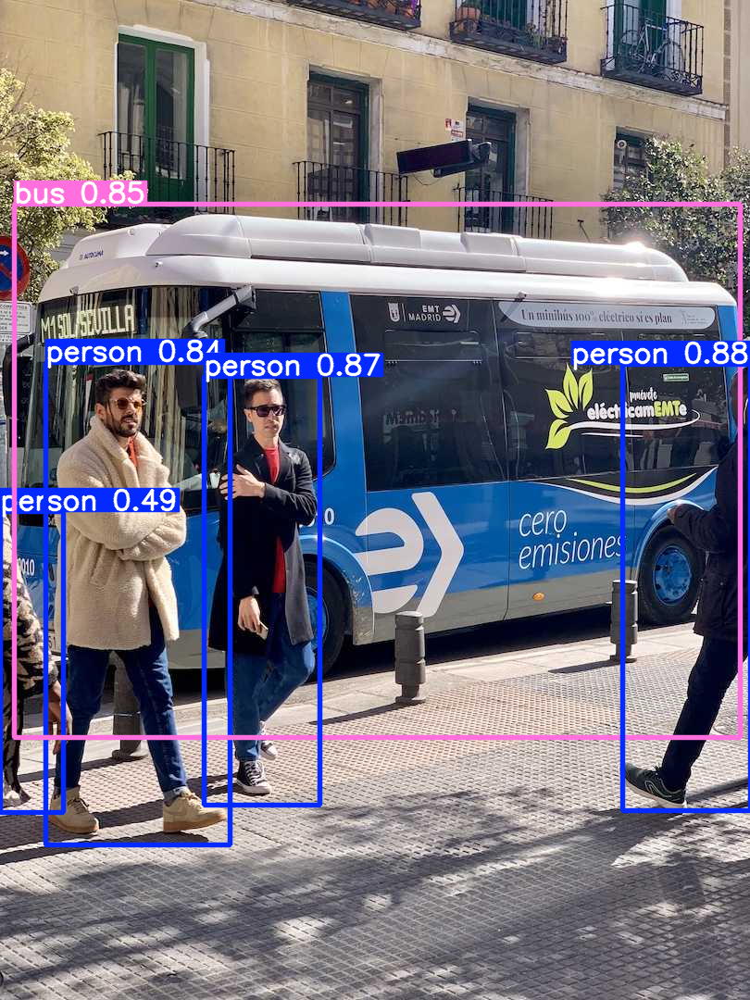

Saved 1 image to runs/detect/exp2


✅ Saved: prediction_img2.png


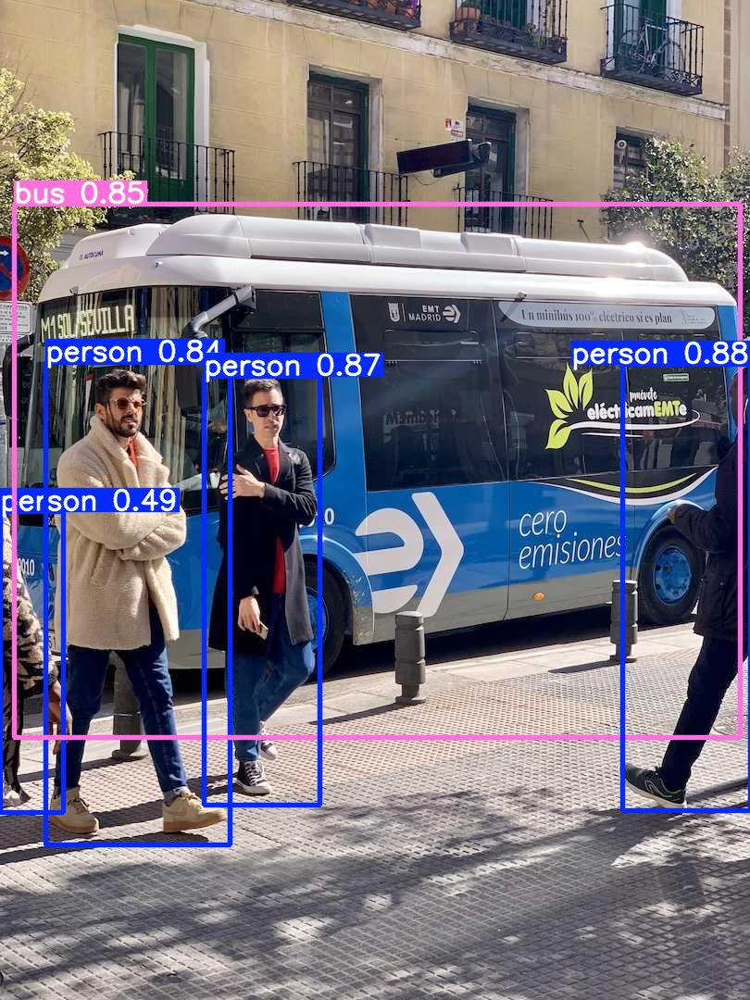

In [9]:
import torch
import os
import glob
import shutil
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

# Load YOLOv5 model (small version)
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

# Define 2 image URLs
img_paths = [
    'https://ultralytics.com/images/zidane.jpg',
    'https://ultralytics.com/images/bus.jpg'
]

# Loop through both images
for i, img_path in enumerate(img_paths):
    print(f"\n🔍 Running detection on Image {i+1}...")

    # Perform inference
    results = model(img_path)

    # Print and show results
    results.print()
    results.show()

    # Save prediction image
    results.save()  # Saves to runs/detect/exp*

    # Find latest saved image
    exp_dirs = sorted(glob.glob('runs/detect/exp*'), key=os.path.getmtime, reverse=True)
    if exp_dirs:
        latest_dir = exp_dirs[0]
        # Find the .jpg file
        saved_img = glob.glob(f"{latest_dir}/*.jpg")[0]
        # Save to a custom filename
        output_name = f"prediction_img{i+1}.png"
        shutil.copy(saved_img, output_name)
        print(f"✅ Saved: {output_name}")

        # Display the saved image
        img = Image.open(output_name)
        display(img)
    else:
        print("❌ Error: No YOLO output found.")


## 🔍 Analyze Predictions

In [2]:
# View detected objects
results.pandas().xyxy[0]  # Bounding boxes and labels

,xmin,ymin,xmax,ymax,confidence,class,name
0,745.578735,48.470245,1142.694336,720.000000,0.868910,0,person
1,124.744019,197.334442,844.397461,716.650635,0.630325,0,person
2,441.238708,439.350586,498.380737,708.571045,0.616792,27,tie
3,594.081787,377.300323,635.423950,437.147797,0.274013,67,cell phone


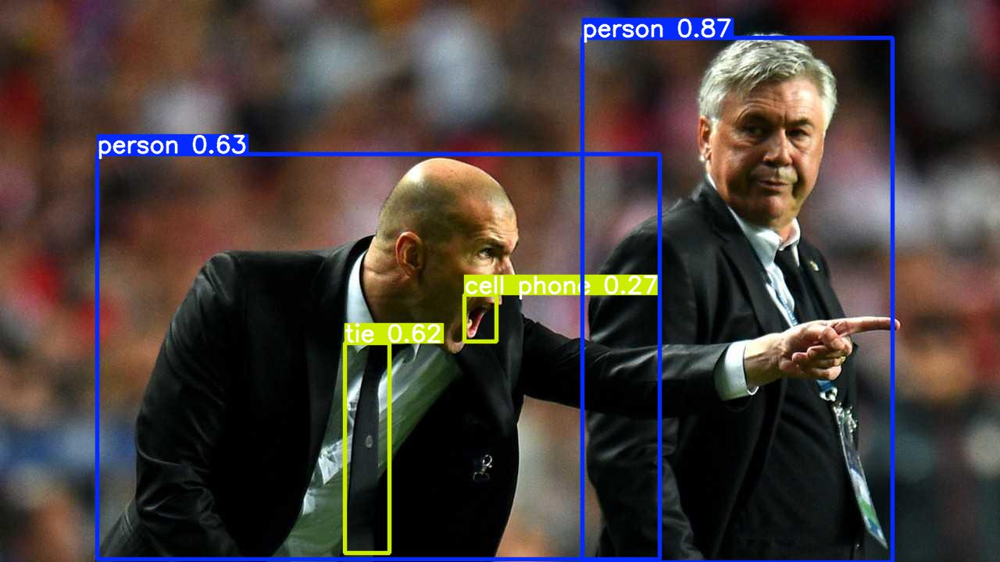

In [10]:
from PIL import Image
from IPython.display import display

img = Image.open('prediction_img1.png')
display(img)

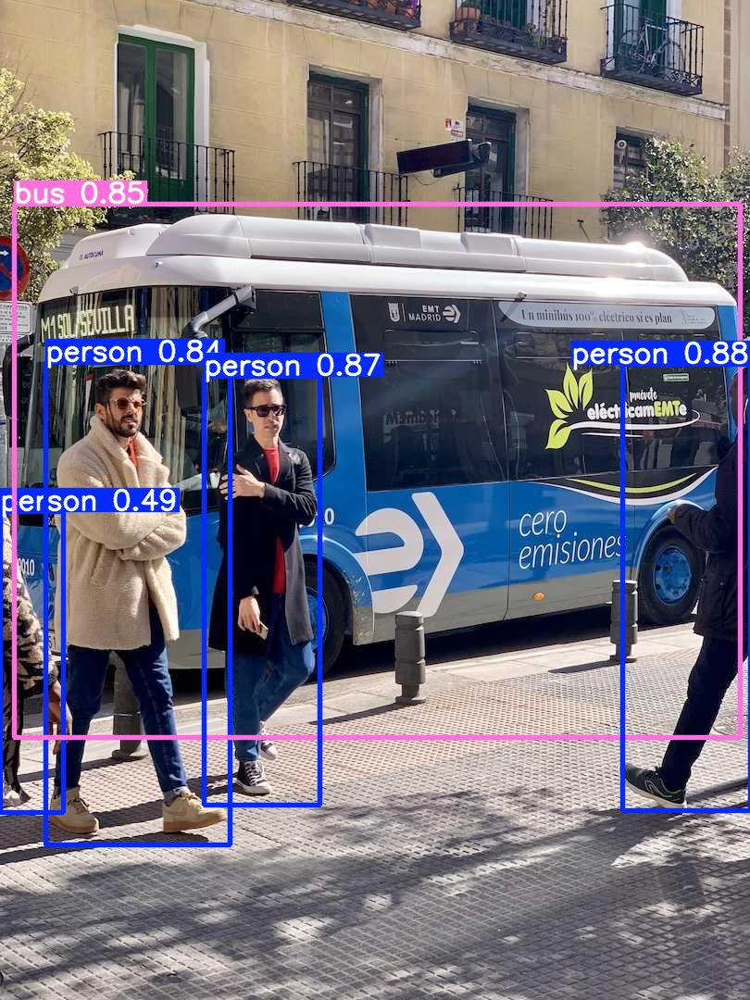

In [11]:
from PIL import Image
from IPython.display import display

img = Image.open('prediction_img2.png')
display(img)


## ✅ Summary
- YOLOv5 offers fast and accurate object detection.
- This demo shows how to use pretrained YOLOv5 with a single line of code.
- You can also fine-tune YOLO for custom object detection tasks.

🔗 Learn more at [Ultralytics GitHub](https://github.com/ultralytics/yolov5)